# Manhattan and Q-Q plot

## Load gwaslab 

In [1]:
import gwaslab as gl

## Load data into Sumstats Object

In [2]:
mysumstats = gl.Sumstats("t2d_bbj.txt.gz",
             snpid="SNP",
             chrom="CHR",
             pos="POS",
             ea="ALT",
             nea="REF",
             neaf="Frq",
             p="P",
             build="19",             
             verbose=False)
mysumstats.fix_chr(verbose=False)

## Create Manhattan plot and QQ plot

2024/10/29 17:25:41 Start to create MQQ plot...v3.5.0:
2024/10/29 17:25:41  -Genomic coordinates version: 19...
2024/10/29 17:25:41  -Genome-wide significance level to plot is set to 5e-08 ...
2024/10/29 17:25:41  -Raw input contains 12557761 variants...
2024/10/29 17:25:41  -MQQ plot layout mode is : mqq
2024/10/29 17:25:42 Finished loading specified columns from the sumstats.
2024/10/29 17:25:42 Start data conversion and sanity check:
2024/10/29 17:25:43  -Removed 0 variants with nan in CHR or POS column ...
2024/10/29 17:25:44  -Removed 0 variants with CHR <=0...
2024/10/29 17:25:45  -Removed 0 variants with nan in P column ...
2024/10/29 17:25:45  -Sanity check after conversion: 0 variants with P value outside of (0,1] will be removed...
2024/10/29 17:25:45  -Sumstats P values are being converted to -log10(P)...
2024/10/29 17:25:46  -Sanity check: 0 na/inf/-inf variants will be removed...
2024/10/29 17:25:47  -Converting data above cut line...
2024/10/29 17:25:47  -Maximum -log10(P

(<Figure size 3000x1000 with 2 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

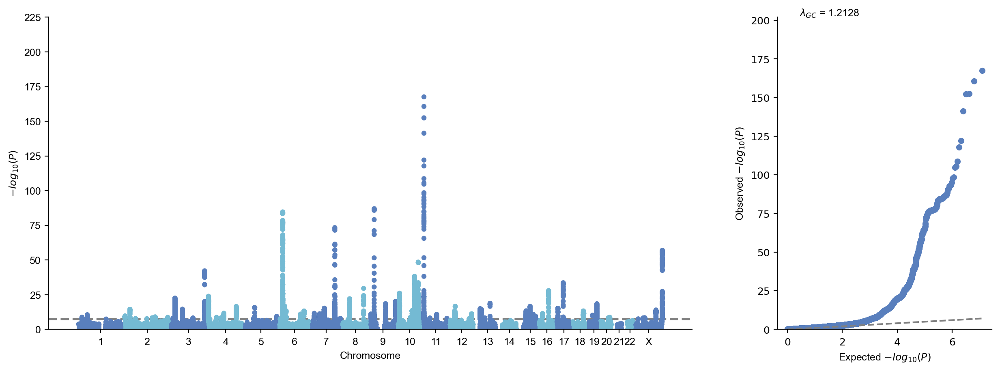

In [3]:
mysumstats.plot_mqq()

## gl.plot_mqq() Options

### Layout mode

If plotting all variants, it may take several minutes. You can use `skip` to skip variants with low MLOG10P in the plot. 

Note: use verbose=False to stop printing log and use check=False to skip sanity check for mqq plots

4 patterns of layout: 

- `mode= "mqq"` (default)
- `mode= "qqm"`
- `mode= "qq"` 
- `mode= "m"`

(<Figure size 3000x1000 with 2 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

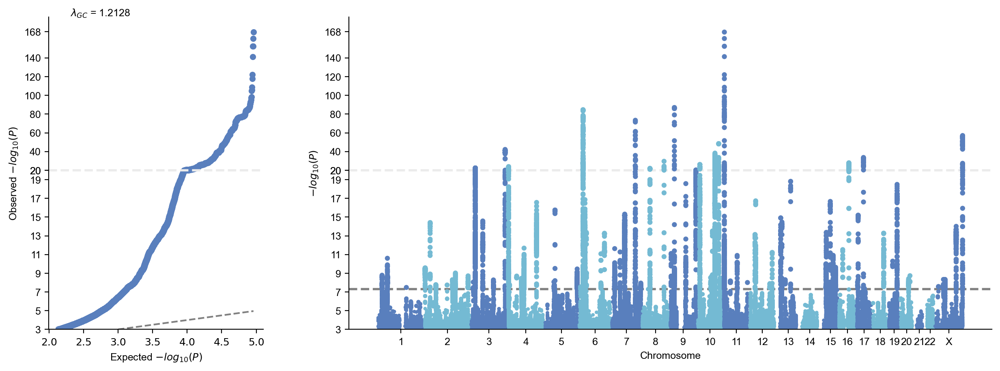

In [4]:
mysumstats.plot_mqq(skip=3,cut=20,mode="qqm",check=False, verbose=False)

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

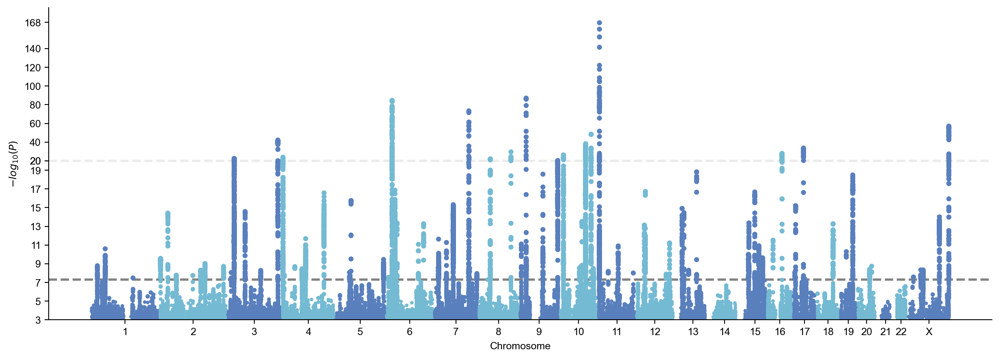

In [5]:
mysumstats.plot_mqq(skip=3,cut=20,mode="m",check=False,verbose=False)

(<Figure size 200x200 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

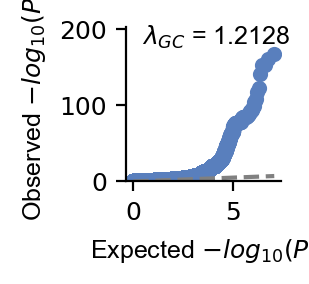

In [6]:
mysumstats.plot_mqq(mode="qq", fig_args= {"figsize":(1,1)},check=False,verbose=False)

### Y axis

#### skip

- `skip` : skip the variants with low -log10(P) values for plotting


(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

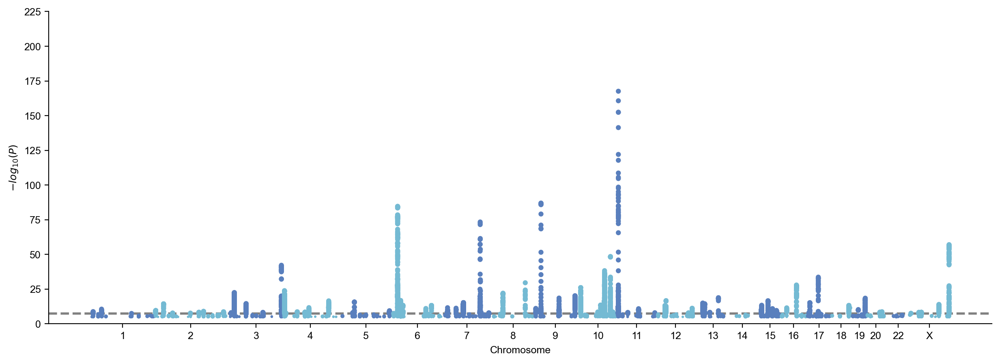

In [7]:
mysumstats.plot_mqq(skip=5,mode= "m", check=False ,verbose=False)

#### cut

 `cut` : scale down the -log10(P) for variants above a certain threshold

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

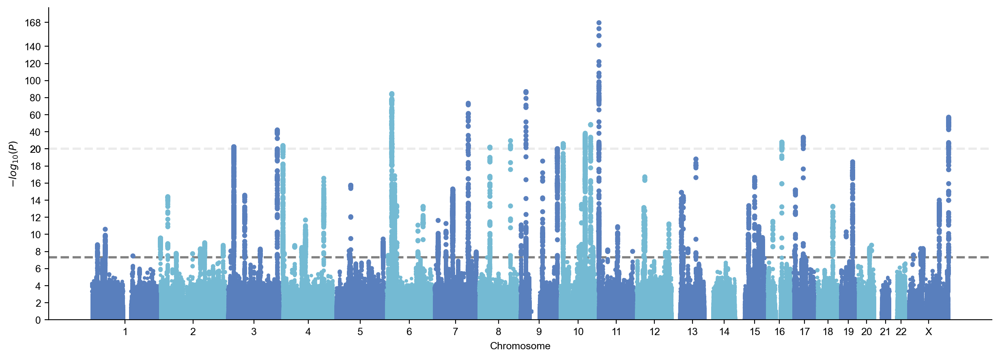

In [8]:
mysumstats.plot_mqq(cut=20 ,mode= "m",check=False,verbose=False)

Make the Y axis jagged to indicate that it has been rescale. 

#### jagged

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

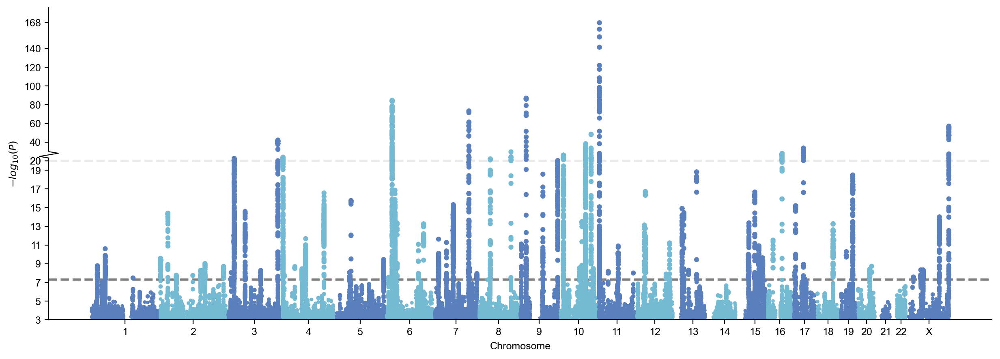

In [9]:
mysumstats.plot_mqq(skip=3,cut=20, jagged=True,mode= "m",check=False,verbose=False)

### X axis

#### use_rank

- `use_rank`: if True, GWASLab will use position rank instead of the physical base-pair positions for x aixs.

There will be no gap if `use_rank = True`

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

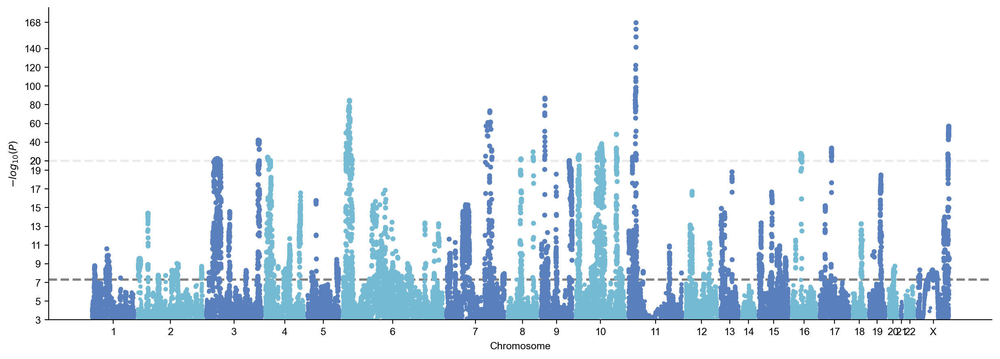

In [10]:
mysumstats.plot_mqq(skip=3,cut=20,use_rank=True,mode= "m",check=False,verbose=False)

#### xtight

`xtight=True` can be used to remove the padding 

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

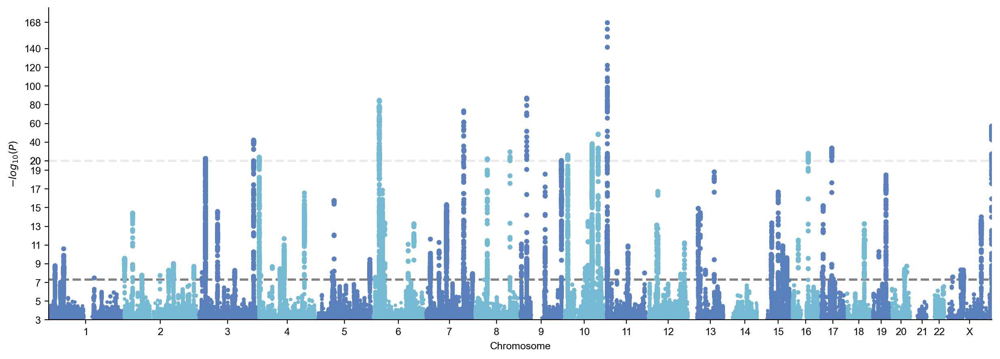

In [11]:
mysumstats.plot_mqq(xtight=True, skip=3,cut=20,mode= "m",check=False,verbose=False)

#### chrpad

`chrpad`: adjust space between each chromosome by `max(POS) * chrpad`

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

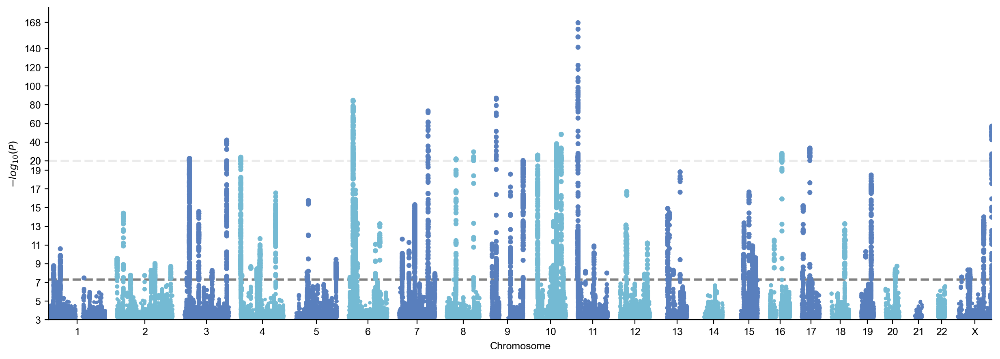

In [12]:
mysumstats.plot_mqq(chrpad=0.2,xtight=True, skip=3,cut=20,mode= "m",check=False,verbose=False)

### Annotation

#### anno=True

`anno=True` : annoatate all lead variants with chr:pos

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

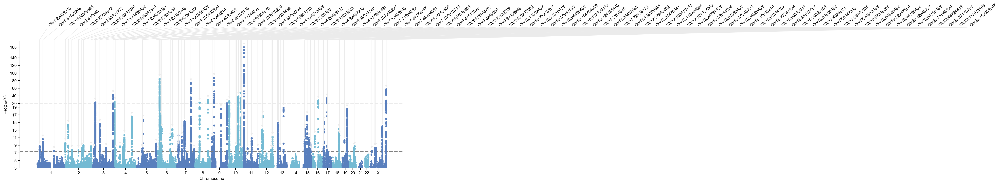

In [13]:
mysumstats.plot_mqq(skip=3,cut=20,anno=True,mode= "m",check=False,verbose=False)

Since there are a large number of novel loci, if we annotate all loci, it will be too messy. Let's only annotate the loci with P<1e-20 by specifying `sig_level_lead=1e-20`.

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

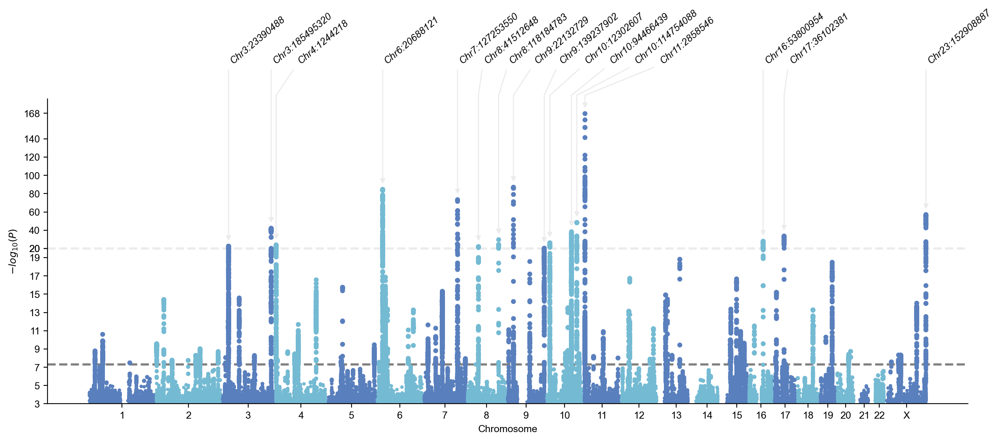

In [14]:
mysumstats.plot_mqq(skip=3,cut=20,anno=True, sig_level_lead=1e-20,mode= "m",check=False,verbose=False)

#### anno="GENENAME"

- `anno="GENENAME"` : automatically annoatate the nearest gene name

Note: remerber to set `build=19` or `build=38` when loading or plotting.

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

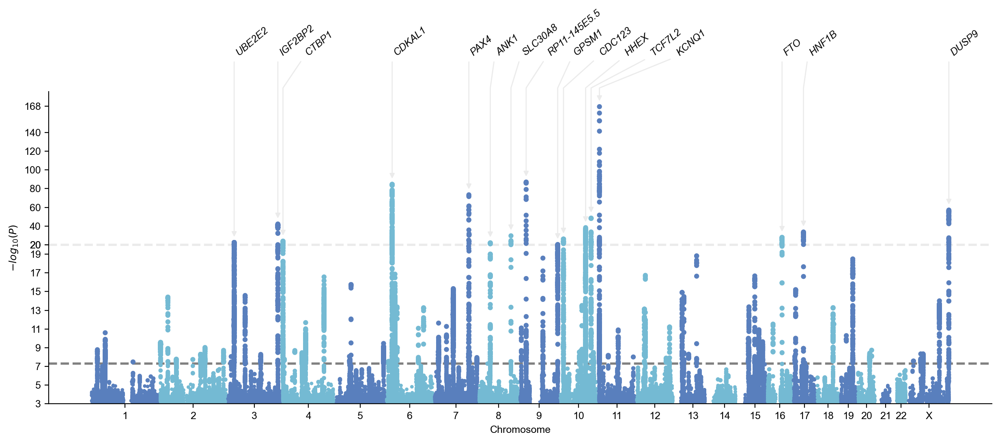

In [15]:
mysumstats.plot_mqq(skip=3,cut=20,anno="GENENAME", sig_level_lead=1e-20,mode= "m",check=False,verbose=False)

You can specify `anno_gtf_path` to use you own GTF file for GENENAME annotation

In [16]:
# mysumstats.plot_mqq(anno_gtf_path="/home/yunye/.gwaslab/Homo_sapiens.GRCh37.87.chr.gtf.gz",anno="GENENAME")

#### anno_d

We can use `anno_d` to slightly adjust the arrows.

`anno_d` accepts a dictionary of `index of annotation`: `left`/`right`

For example, `1:"left"` means to adjust towards left. 

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

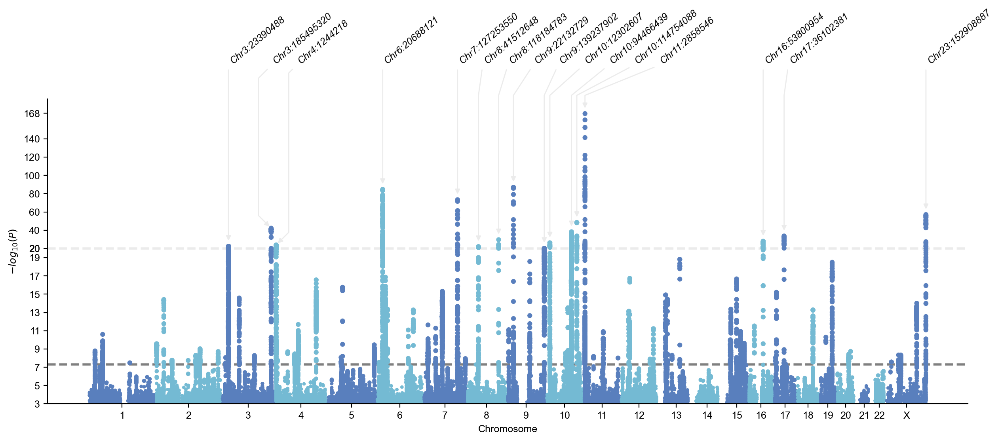

In [17]:
mysumstats.plot_mqq(anno_d={1:"left",2:"right"}, skip=3,cut=20,anno=True, sig_level_lead=1e-20,mode= "m",check=False,verbose=False)

#### anno_scale

We can also use `arm_scale` to adjust where to put the annotation texts.

For example, `arm_scale=1.2` means the default length will be multiplied by a factor of 1.2.

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

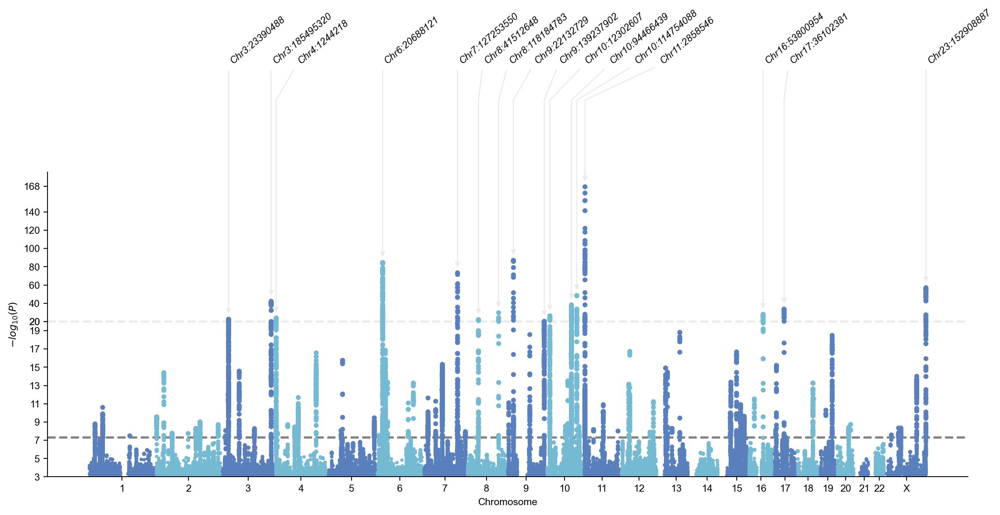

In [18]:
mysumstats.plot_mqq(arm_scale=1.2, skip=3,cut=20,anno=True, sig_level_lead=1e-20,mode= "m",check=False,verbose=False)

`arm_scale_d` accepts a dictionary of `index of annotation`: `arm_scale`

For example, `1:1.2` means to adjust the arm of the second by a factor of 1.2. 

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

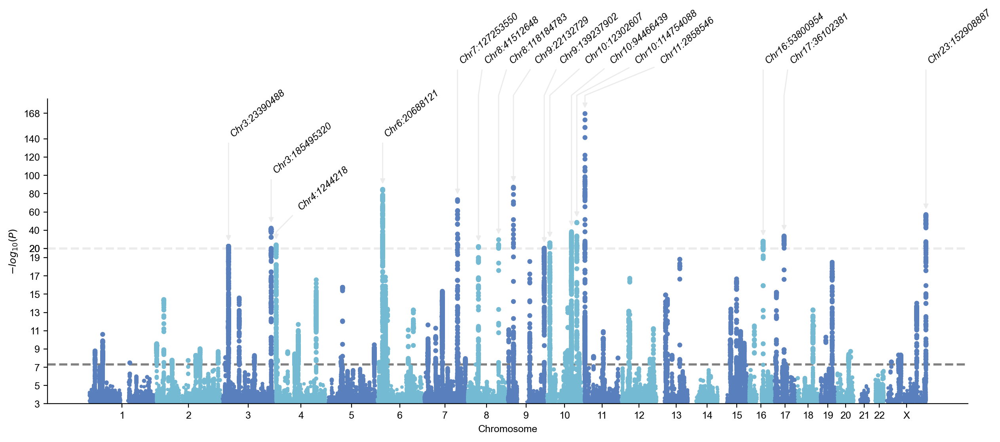

In [19]:
mysumstats.plot_mqq(arm_scale_d={0:0.8,
                                 1:0.7,
                                 2:0.6,
                                 3:0.8}, 
                    skip=3,cut=20,anno=True, sig_level_lead=1e-20,mode= "m",check=False,verbose=False)

#### anno_style

GWASLab provides three types of different annotation styles

`anno_style="right"`, `anno_style="expand"`, and `anno_style="tight"`

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

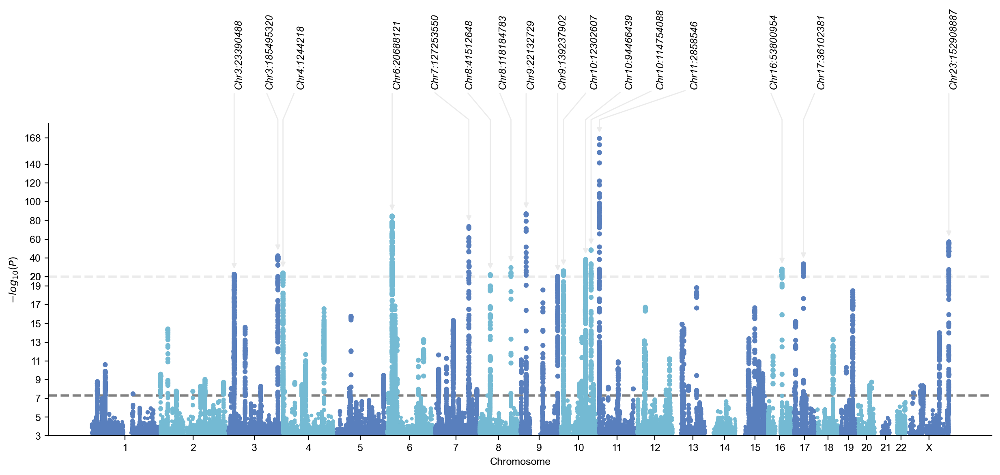

In [20]:
mysumstats.plot_mqq(skip=3,cut=20,anno=True,anno_style="expand", sig_level_lead=1e-20,mode= "m",check=False,verbose=False)

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

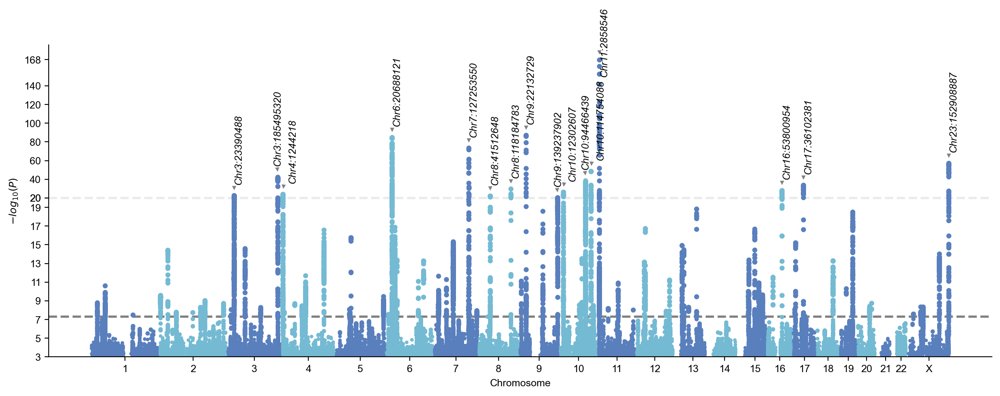

In [21]:
mysumstats.plot_mqq(skip=3,cut=20,anno=True,anno_style="tight", sig_level_lead=1e-20,mode= "m", check=False,verbose=False)

#### anno_set

If we want to annotate only a subset of variants, we can pass a list of variant IDs to `anno_set`. 

Let's check all lead variants and select only two to annotate.

In [22]:
mysumstats.get_lead(verbose=False).sort_values(by="P")

,SNPID,CHR,POS,EA,NEA,EAF,P,STATUS
7947442,11:2858546_C_T,11,2858546,C,T,0.6209,2.580000e-168,1995999
6903480,9:22132729_A_G,9,22132729,G,A,0.4367,9.848000e-88,1995999
4664126,6:20688121_T_A,6,20688121,T,A,0.5758,2.062000e-85,1995999
5965364,7:127253550_C_T,7,127253550,C,T,0.9081,4.101000e-74,1995999
12554976,X:152908887_G_A,23,152908887,G,A,0.6792,9.197000e-58,1995999
...,...,...,...,...,...,...,...,...
12272930,X:21569920_A_G,23,21569920,G,A,0.3190,2.616000e-08,1995999
4599424,6:7226959_C_T,6,7226959,C,T,0.6657,2.849000e-08,1995999
10287151,15:90393949_C_CT,15,90393949,C,CT,0.3445,3.134000e-08,1995999
534095,1:154309595_TA_T,1,154309595,TA,T,0.0947,3.289000e-08,1995999


This time, let's annotate 1:154309595_TA_T and 2:27734972_G_A with its nearest gene names!


`anno_set` : the set of variants you want to annotate

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

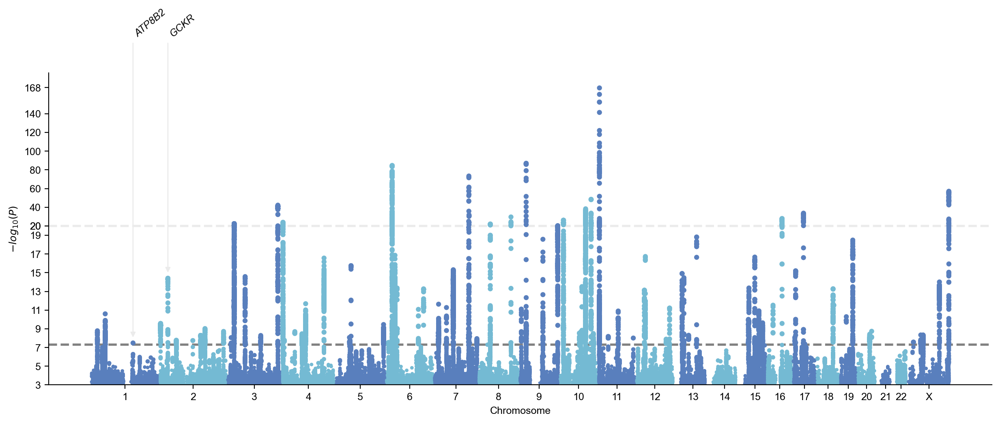

In [23]:
mysumstats.plot_mqq(skip=3,cut=20,anno="GENENAME",anno_set=["1:154309595_TA_T","2:27734972_G_A"],mode= "m",check=False,verbose=False)

#### anno_alias

anno_alias accepts a dictionary of `SNPID`:`string`. You can use this to customized the text for annotation.

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

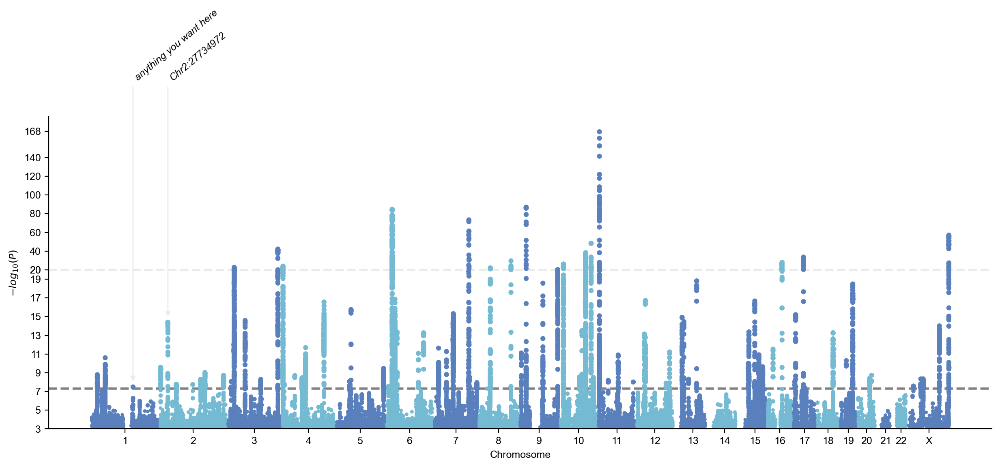

In [24]:
mysumstats.plot_mqq(skip=3,
                    cut=20,
                    anno=True,
                    anno_set=["1:154309595_TA_T","2:27734972_G_A"],
                    anno_alias={"1:154309595_TA_T":"anything you want here"},
                    mode= "m",
                    verbose=False)

### Highlight loci & Pinpoint variants (single group)

- `highlight`: a variant list of loci you want to highlight
- `pinpoint`: a variant list of variants you want to pinpoint

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

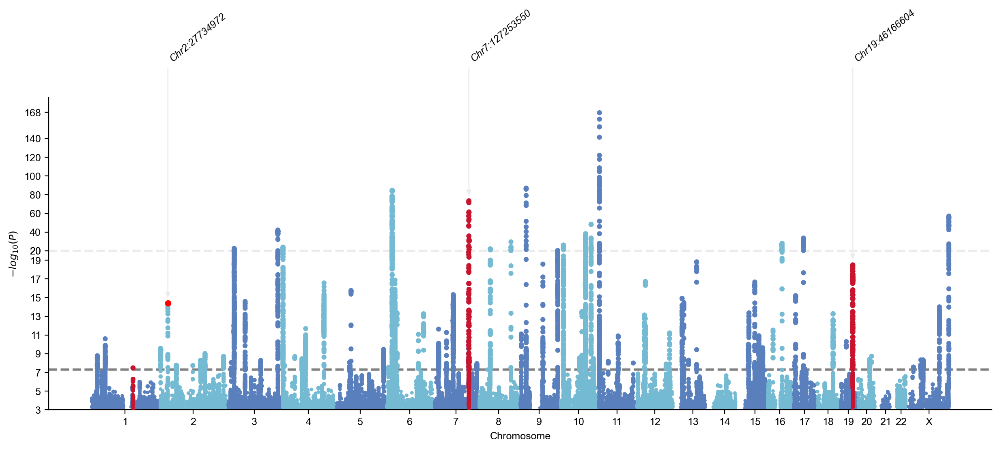

In [25]:
mysumstats.plot_mqq(skip=3,cut=20,
                    anno=True,
                    anno_set=["2:27734972_G_A","2:27734972_G_A","7:127253550_C_T", "19:46166604_C_T"],
                    highlight=["19:46166604_C_T","1:154309595_TA_T","7:127253550_C_T"],
                    highlight_windowkb=1000,
                    pinpoint=["2:27734972_G_A"],
                    mode= "m",
                    check=False,verbose=False)

### Highlight loci & Pinpoint variants (multi-group)

Instead of a list, you can provide a list of lists. Each member list is then a group.

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

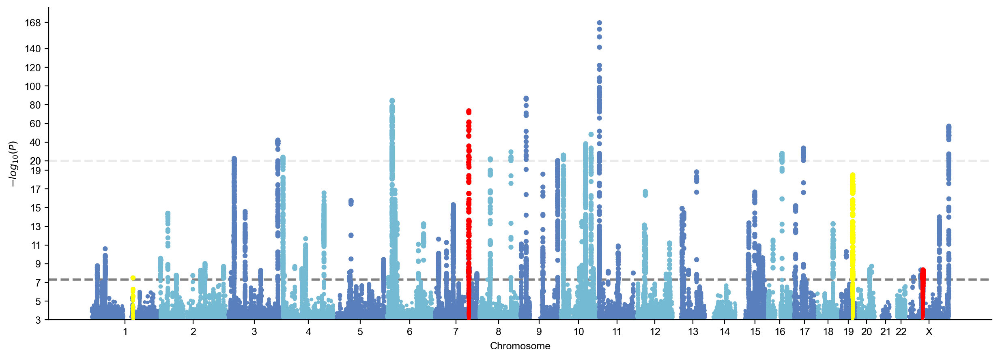

In [26]:
mysumstats.plot_mqq(skip=3,cut=20,
                    highlight=[
                               ["19:46166604_C_T","1:154309595_TA_T"],
                               ["X:57170781_A_AT","7:127253550_C_T"]
                              ],
                    highlight_windowkb=1000,
                    highlight_color=["yellow","red"],
                    mode= "m",
                    check=False,verbose=False)

### MAF-stratified QQ plot

(<Figure size 3000x1000 with 2 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

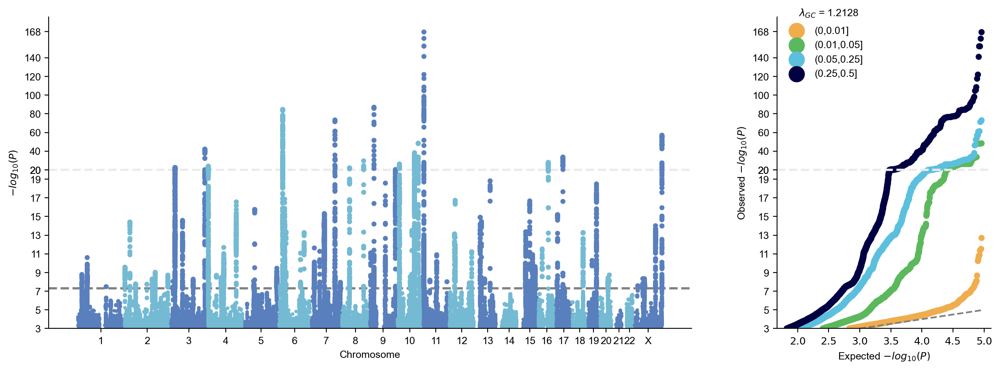

In [27]:
mysumstats.plot_mqq(skip=3,cut=20, mode="mqq",stratified=True,check=False,verbose=False)

### Auxiliary lines

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

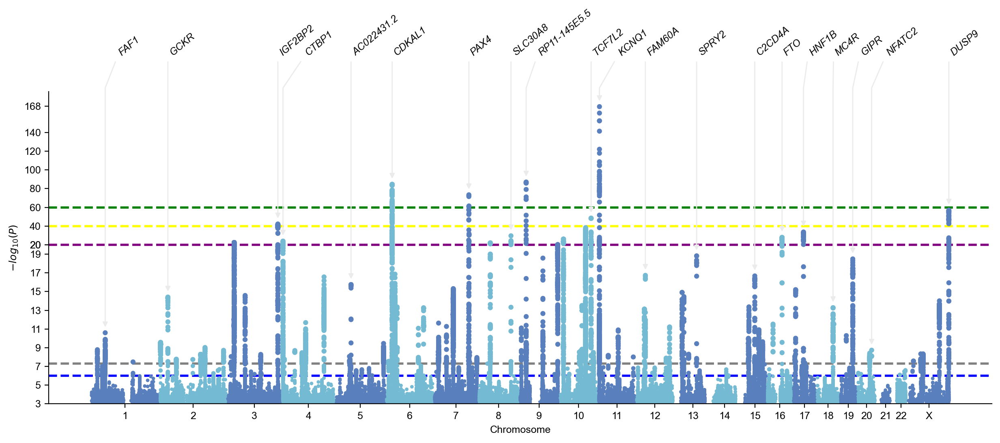

In [28]:
mysumstats.plot_mqq(skip=3,
                build="19",
                anno="GENENAME",
                windowsizekb=1000000,
                cut=20,
                cut_line_color="purple",
                sig_level=5e-8,  
                sig_level_lead=1e-6, 
                sig_line_color="grey",
                suggestive_sig_line = True,
                suggestive_sig_level = 1e-6,
                suggestive_sig_line_color="blue",
                additional_line=[1e-40,1e-60],
                additional_line_color=["yellow","green"],
                mode= "m",check=False,verbose=False)

### Font and marker size

- `fontsize`
- `anno_fontsize`
- `title_fontsize`
- `marker_size`

(<Figure size 3000x1000 with 1 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

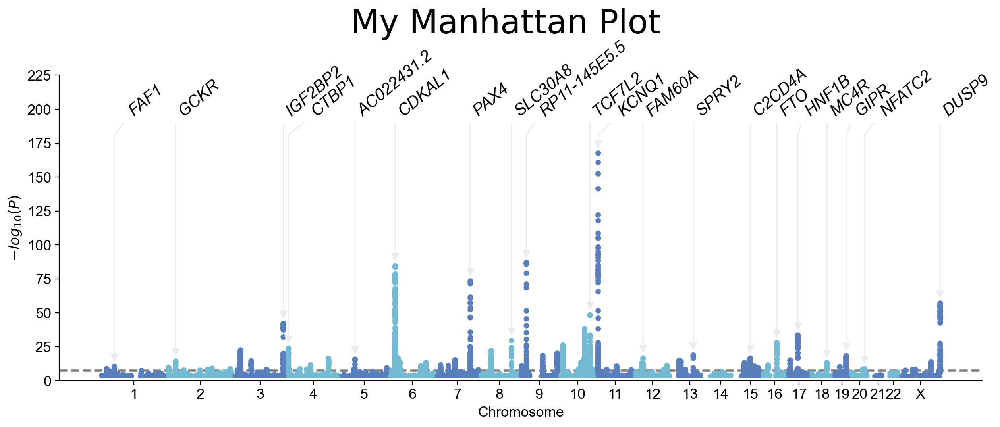

In [29]:
mysumstats.plot_mqq(skip=3,
          anno="GENENAME",
          title= "My Manhattan Plot",
          windowsizekb=1000000,
          fontsize =13,
          anno_fontsize = 15,
          title_fontsize = 30,
          marker_size=(5,25),
          mode= "m", 
          verbose=False,
          check=False
)

### Colors

- `colors`
- `cut_line_color`
- `sig_line_color`
- `highlight_color`
- `pinpoint_color`
- `maf_bin_colors`

(<Figure size 3000x1000 with 2 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

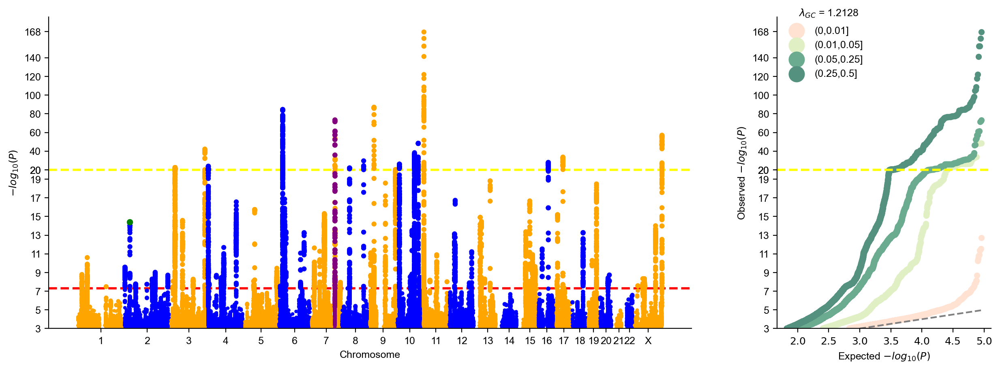

In [30]:
mysumstats.plot_mqq(skip=3,
          cut=20,
          stratified=True,
          highlight=["7:127253550_C_T"],
          pinpoint=["2:27734972_G_A"],
          colors=["orange","blue"],
          cut_line_color="yellow",
          sig_line_color="red",
          highlight_color="purple",
          pinpoint_color ="green",
          maf_bin_colors = ["#FFE2D1","#E1F0C4", "#6BAB90","#55917F"],
          check=False,verbose=False
)

### Save plots

2024/10/29 17:32:02 Start to create MQQ plot...v3.5.0:
2024/10/29 17:32:02  -Genomic coordinates version: 19...
2024/10/29 17:32:02  -Genome-wide significance level to plot is set to 5e-08 ...
2024/10/29 17:32:02  -Raw input contains 12557761 variants...
2024/10/29 17:32:02  -MQQ plot layout mode is : mqq
2024/10/29 17:32:04 Finished loading specified columns from the sumstats.
2024/10/29 17:32:04 Start data conversion and sanity check:
2024/10/29 17:32:04  -Removed 0 variants with nan in CHR or POS column ...
2024/10/29 17:32:06  -Removed 0 variants with CHR <=0...
2024/10/29 17:32:07  -Removed 0 variants with nan in EAF column ...
2024/10/29 17:32:07  -Removed 0 variants with nan in P column ...
2024/10/29 17:32:07  -Sanity check after conversion: 0 variants with P value outside of (0,1] will be removed...
2024/10/29 17:32:08  -Sumstats P values are being converted to -log10(P)...
2024/10/29 17:32:08  -Sanity check: 0 na/inf/-inf variants will be removed...
2024/10/29 17:32:09  -Conv

(<Figure size 4500x1500 with 2 Axes>, <gwaslab.g_Log.Log at 0x7f781811d0a0>)

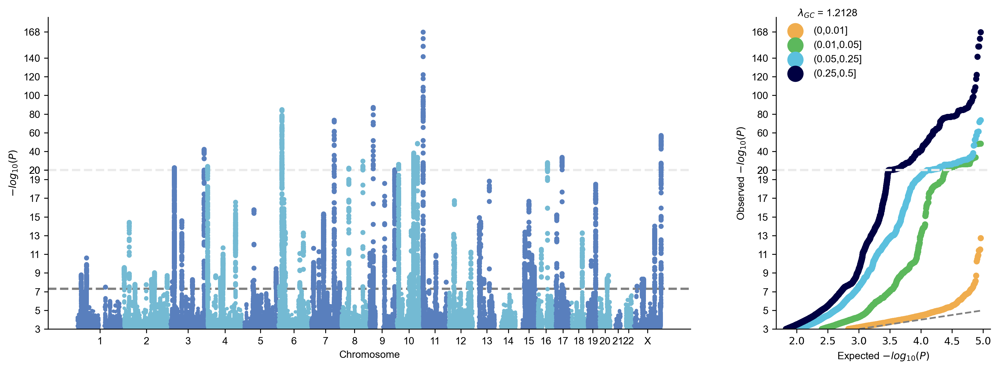

In [31]:
mysumstats.plot_mqq(skip=3,
                    cut=20, 
                    mode="mqq",
                    stratified=True,
                    save="my_maf_stratified_mqq_plot.png",
                    save_args={"dpi":300,"facecolor":"white"})

### Fig and Log object

plot_mqq will return a matplotlib figure object and a gwaslab log object

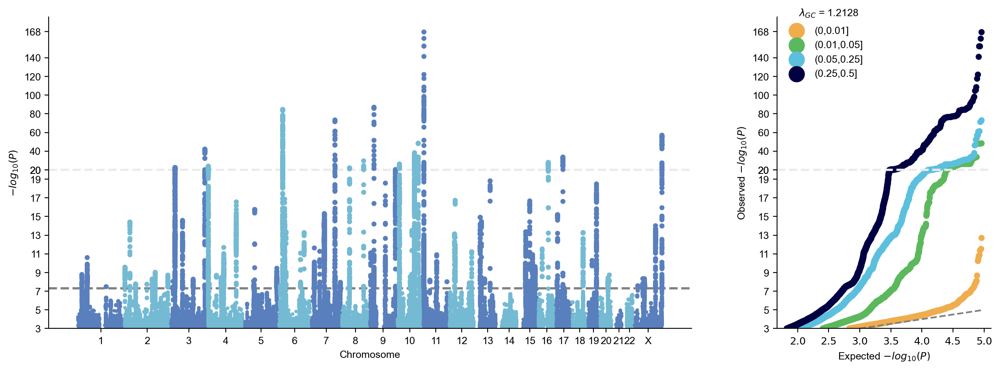

In [32]:
my_mqqplot,my_log = mysumstats.plot_mqq(skip=3,cut=20, mode="mqq",stratified=True,verbose=False)

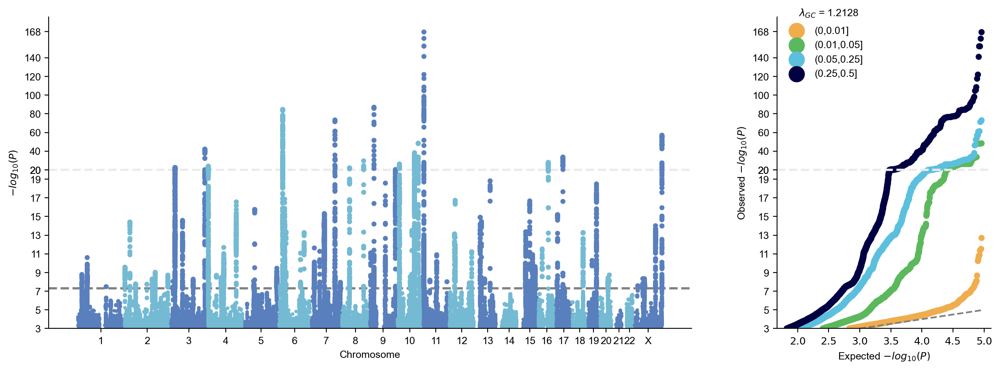

In [33]:
my_mqqplot

In [34]:
my_log

In [35]:
my_log.show()

2024/10/29 17:25:09 Sumstats Object created.
2024/10/29 17:25:41 Start to create MQQ plot...v3.5.0:
2024/10/29 17:25:41  -Genomic coordinates version: 19...
2024/10/29 17:25:41  -Genome-wide significance level to plot is set to 5e-08 ...
2024/10/29 17:25:41  -Raw input contains 12557761 variants...
2024/10/29 17:25:41  -MQQ plot layout mode is : mqq
2024/10/29 17:25:42 Finished loading specified columns from the sumstats.
2024/10/29 17:25:42 Start data conversion and sanity check:
2024/10/29 17:25:43  -Removed 0 variants with nan in CHR or POS column ...
2024/10/29 17:25:44  -Removed 0 variants with CHR <=0...
2024/10/29 17:25:45  -Removed 0 variants with nan in P column ...
2024/10/29 17:25:45  -Sanity check after conversion: 0 variants with P value outside of (0,1] will be removed...
2024/10/29 17:25:45  -Sumstats P values are being converted to -log10(P)...
2024/10/29 17:25:46  -Sanity check: 0 na/inf/-inf variants will be removed...
2024/10/29 17:25:47  -Converting data above cut l